# Описание проекта

Оператор связи «Ниединогоразрыва.ком» хочет научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и договорах.

### Описание услуг

Оператор предоставляет два основных типа услуг:   

1. Стационарную телефонную связь. Возможно подключение телефонного аппарата к нескольким линиям одновременно.  
2. Интернет. Подключение может быть двух типов: через телефонную линию (DSL*,* от англ. *digital subscriber line*, «цифровая абонентская линия») или оптоволоконный кабель (*Fiber optic*).  

Также доступны такие услуги:  

- Интернет-безопасность: антивирус (*DeviceProtection*) и блокировка небезопасных сайтов (*OnlineSecurity*);  
- Выделенная линия технической поддержки (*TechSupport*);  
- Облачное хранилище файлов для резервного копирования данных (*OnlineBackup*);
- Стриминговое телевидение (*StreamingTV*) и каталог фильмов (*StreamingMovies*).  

За услуги клиенты могут платить каждый месяц или заключить договор на 1–2 года.   Доступны различные способы расчёта и возможность получения электронного чека.

### Описание данных

Данные состоят из файлов, полученных из разных источников:  

- `contract_new.csv` — информация о договоре;  
- `personal_new.csv` — персональные данные клиента;  
- `internet_new.csv` — информация об интернет-услугах;  
- `phone_new.csv` — информация об услугах телефонии.
 
Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020.

# План работы

1. Знакомство с данными. Необходимо выгрузить и проверить типы данных и наличие пропусков. 
2. Предобработка данных. На этом этапе нужно подготовить данные. В данном случае требуется обьединить датафреймы по ключу customerID, избавиться от пропусков в последствии, изменить типы данных и привести названия столбцов к нижнему регистру.
3. Исследовательский анализ данных. Необходимо визуализировать данные, исследовать корреляцию между признаками и избавиться от выбросов. 
4. Подготовить данные для обучения модели. Удалить,если есть, ненужные столбцы, разделить данные на выборки, закодировать категориальные признаки с помощью OneHotEncoder, для линейных моделей масштабировать числовые признаки. 
5. Подбор гиперпараметров и обучение 2-3 моделей. 
6. Тестирование наилучшей модели. 
7. Вывод. 

# Цель работы

Прогноз оттока клиентов для предложения им ряда дополнительных услуг или бонусов для оптимизации и регулировки количества пользователей данного оператора связи, следствием чего является увеличение/сохранение выручки компании.

# Знакомство с данными

Импорт библиотек

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from scipy import stats as st
from scipy.stats import f_oneway
from scipy.stats import spearmanr

import seaborn as sns

import phik
from phik.report import plot_correlation_matrix
from phik import report

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.preprocessing import OneHotEncoder

from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import warnings

warnings.filterwarnings('ignore')

Чтение файлов с датасетами

In [2]:
try:
    contract = pd.read_csv('contract_new.csv')
    personal = pd.read_csv('personal_new.csv')
    internet = pd.read_csv('internet_new.csv')
    phone = pd.read_csv('phone_new.csv')
except:
    contract = pd.read_csv('/datasets/contract_new.csv')
    personal = pd.read_csv('/datasets/personal_new.csv')
    internet = pd.read_csv('/datasets/internet_new.csv')
    phone = pd.read_csv('/datasets/phone_new.csv')

Напишем функцию для оптимизации просмотра данных

In [3]:
def info(df):
    display(df.info())
    display(df.head(10))
    display(df.describe())

Познакомимся с фреймом contract

In [4]:
info(contract)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


None

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5
5,9305-CDSKC,2019-03-01,No,Month-to-month,Yes,Electronic check,99.65,1150.96
6,1452-KIOVK,2018-04-01,No,Month-to-month,Yes,Credit card (automatic),89.10,2058.21
7,6713-OKOMC,2019-04-01,No,Month-to-month,No,Mailed check,29.75,300.48
8,7892-POOKP,2017-07-01,No,Month-to-month,Yes,Electronic check,104.80,3573.68
9,6388-TABGU,2014-12-01,2017-05-01,One year,No,Bank transfer (automatic),56.15,1628.35


,MonthlyCharges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000


Познакомимся с фреймом personal

In [5]:
info(personal)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


None

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No
5,9305-CDSKC,Female,0,No,No
6,1452-KIOVK,Male,0,No,Yes
7,6713-OKOMC,Female,0,No,No
8,7892-POOKP,Female,0,Yes,No
9,6388-TABGU,Male,0,No,Yes


,SeniorCitizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


Познакомимся с фреймом internet 

In [6]:
info(internet)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


None

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No
5,9305-CDSKC,Fiber optic,No,No,Yes,No,Yes,Yes
6,1452-KIOVK,Fiber optic,No,Yes,No,No,Yes,No
7,6713-OKOMC,DSL,Yes,No,No,No,No,No
8,7892-POOKP,Fiber optic,No,No,Yes,Yes,Yes,Yes
9,6388-TABGU,DSL,Yes,Yes,No,No,No,No


,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


Познакомимся с фреймом phone

In [7]:
info(phone)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


None

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes
5,7892-POOKP,Yes
6,6388-TABGU,No
7,9763-GRSKD,No
8,7469-LKBCI,No
9,8091-TTVAX,Yes


,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390


### Вывод  

1. Contract
 - В столбце BeginDate необходимо изменить изменить тип данных на datetime64;  
 - В столбце TotalCharges необходимо изменить изменить тип данных на float64;
 - EndDate является целевым признаком. Тут необходимо заменить No на дату сбора данных (1 февраля 2020);
 -  PaperlessBilling, Type, PaymentMethod являются категориальными признаками и нуждаются в кодировке.
2. Personal  
 - Gender, Partner и Dependents являются категориальными признаками и нуждаются в кодировке.
3. Internet
 - Всем столбцам кроме customerID требуется кодировка.
4. Phone
 - MultipleLines требуется кодировка. 
5. Общий вывод по данным
 - В данных нет пропусков, но во фреймах Internet и Phone есть данные не обо всех клиентах, что может привести к потере данных при обьединении фреймов. 

# Предобработка данных

Для начала добавим признак ухода клиента

In [8]:
contract['tag'] = (contract['EndDate'] != 'No').astype(int)
contract.head(10)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,tag
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04,0
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84,0
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17,0
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6,0
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5,0
5,9305-CDSKC,2019-03-01,No,Month-to-month,Yes,Electronic check,99.65,1150.96,0
6,1452-KIOVK,2018-04-01,No,Month-to-month,Yes,Credit card (automatic),89.10,2058.21,0
7,6713-OKOMC,2019-04-01,No,Month-to-month,No,Mailed check,29.75,300.48,0
8,7892-POOKP,2017-07-01,No,Month-to-month,Yes,Electronic check,104.80,3573.68,0
9,6388-TABGU,2014-12-01,2017-05-01,One year,No,Bank transfer (automatic),56.15,1628.35,1


Заменим в EndDate значения "No" датой выгрузки датасета

In [9]:
contract['EndDate'] = contract['EndDate'].replace(['No'], ['2020-02-01'])

Заменим тип данных в BeginDate и EndDate

In [10]:
contract['BeginDate'] = pd.to_datetime(contract['BeginDate'], format='%Y-%m-%d')
contract['EndDate'] = pd.to_datetime(contract['EndDate'], format='%Y-%m-%d')
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   BeginDate         7043 non-null   datetime64[ns]
 2   EndDate           7043 non-null   datetime64[ns]
 3   Type              7043 non-null   object        
 4   PaperlessBilling  7043 non-null   object        
 5   PaymentMethod     7043 non-null   object        
 6   MonthlyCharges    7043 non-null   float64       
 7   TotalCharges      7043 non-null   object        
 8   tag               7043 non-null   int64         
dtypes: datetime64[ns](2), float64(1), int64(1), object(5)
memory usage: 495.3+ KB


Заменим тип данных в TotalCharges

In [11]:
contract['TotalCharges'] = pd.to_numeric(contract['TotalCharges'], errors ='coerce')
contract['TotalCharges'].isnull().sum()

11

Взглянем, что в чем проблема с пропусками

In [12]:
contract[contract['TotalCharges'].isnull()]

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,tag
488,4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,0
753,3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,0
936,5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,0
1082,4367-NUYAO,2020-02-01,2020-02-01,Two year,No,Mailed check,25.75,NaN,0
1340,1371-DWPAZ,2020-02-01,2020-02-01,Two year,No,Credit card (automatic),56.05,NaN,0
3331,7644-OMVMY,2020-02-01,2020-02-01,Two year,No,Mailed check,19.85,NaN,0
3826,3213-VVOLG,2020-02-01,2020-02-01,Two year,No,Mailed check,25.35,NaN,0
4380,2520-SGTTA,2020-02-01,2020-02-01,Two year,No,Mailed check,20.00,NaN,0
5218,2923-ARZLG,2020-02-01,2020-02-01,One year,Yes,Mailed check,19.70,NaN,0
6670,4075-WKNIU,2020-02-01,2020-02-01,Two year,No,Mailed check,73.35,NaN,0


Вероятно это новые пользователи. Заменим пропуски в этом стлолбце на 0

In [13]:
contract['TotalCharges'] = contract['TotalCharges'].fillna(0)

Обьеденим все датафреймы в один и проиндексируем фрейм по customerID

In [14]:
df = contract \
    .merge(personal, how='left', on='customerID') \
    .merge(internet, how='left', on='customerID') \
    .merge(phone, how='left', on='customerID') 

df = df.set_index('customerID')

In [15]:
df.head()

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,tag,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,2020-02-01,Month-to-month,Yes,Electronic check,29.85,31.04,0,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN
5575-GNVDE,2017-04-01,2020-02-01,One year,No,Mailed check,56.95,2071.84,0,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
3668-QPYBK,2019-10-01,2020-02-01,Month-to-month,Yes,Mailed check,53.85,226.17,0,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
7795-CFOCW,2016-05-01,2020-02-01,One year,No,Bank transfer (automatic),42.30,1960.60,0,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,NaN
9237-HQITU,2019-09-01,2020-02-01,Month-to-month,Yes,Electronic check,70.70,353.50,0,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


Пропуски в пунктах 12-19 вероятнее всего означают отстутствие этого сервиса у клиента. Заменим этим пропуски "No"

In [16]:
columns = ['InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'MultipleLines']
for i in columns:
    df[i] = df[i].fillna('No')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   BeginDate         7043 non-null   datetime64[ns]
 1   EndDate           7043 non-null   datetime64[ns]
 2   Type              7043 non-null   object        
 3   PaperlessBilling  7043 non-null   object        
 4   PaymentMethod     7043 non-null   object        
 5   MonthlyCharges    7043 non-null   float64       
 6   TotalCharges      7043 non-null   float64       
 7   tag               7043 non-null   int64         
 8   gender            7043 non-null   object        
 9   SeniorCitizen     7043 non-null   int64         
 10  Partner           7043 non-null   object        
 11  Dependents        7043 non-null   object        
 12  InternetService   7043 non-null   object        
 13  OnlineSecurity    7043 non-null   object        
 14  OnlineBackup  

### Вывод  

- Добавлен целевой признак ухода/неухода клиента
- Заменили в EndDate значения "No" датой выгрузки датасета
- Заменили тип данных в BeginDate, EndDate и TotalCharges и избавились от попусков
- Обьеденили датасеты и устранили пропуски  
 
Теперь в данных порядок. Приводить названия столбцов к нижненму регистру не стала, так как в целом в этом нет необходимости

# Исследовательский анализ данных

Построим гистограммы и диаграммы размаха для числовых данных

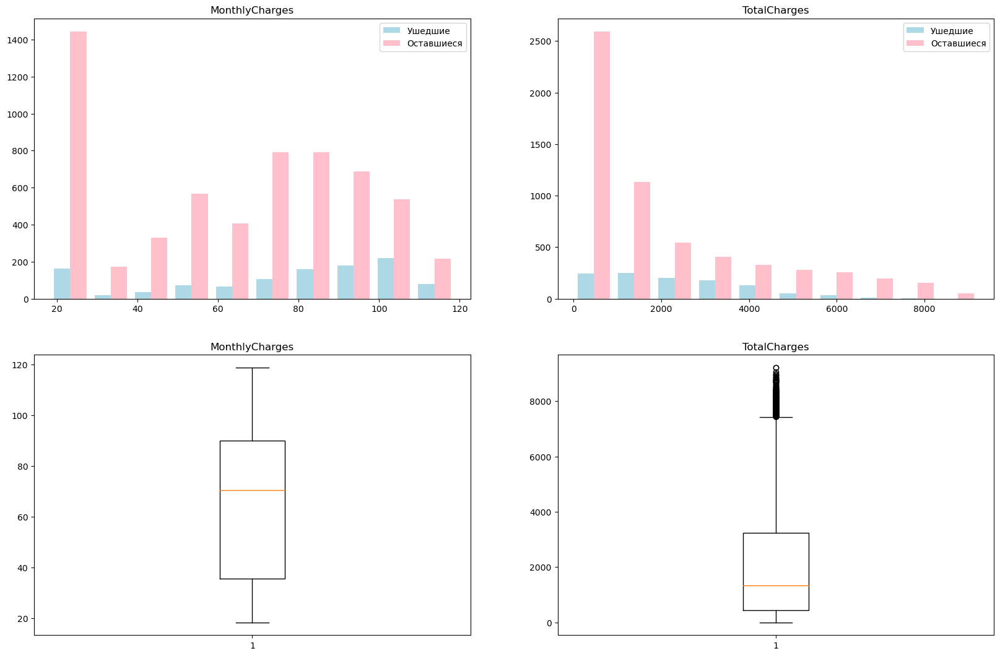

In [18]:
col = 2
row = 3
columns = ['MonthlyCharges', 'TotalCharges']

plt.figure(figsize=(20, 20))

j = 0

for i in columns:
    j += 1 
    plt.subplot(row, col, j)
    plt.hist([df[i].loc[df['tag'] == 1], df[i].loc[df['tag'] == 0]], label=['Ушедшие', 'Оставшиеся'], color=['lightblue', 'pink'])
    plt.title(i)
    plt.legend()
    
for i in columns:
    j += 1 

    plt.subplot(row, col, j)
    plt.boxplot(df[i])
    plt.title(i)

plt.show()

Значения в MonthlyCharges распредедяются неравномерно. Есть пики на 20 и 80. Кажется такое распределение значений может говорить о наличии тарифов у оператора или каких то других "групп" клиентов. Гистограмма TotalCharges равномерно убывает. Аномальных выбросов я не увидела. 

In [19]:
df[columns].describe()

,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000
mean,64.761692,2115.312885
std,30.090047,2112.742814
min,18.250000,0.000000
25%,35.500000,436.750000
50%,70.350000,1343.350000
75%,89.850000,3236.690000
max,118.750000,9221.380000


Попробуем провести статистический тест. Для определения зависимости категориальный признак - числовой признак воспользуемся ANOVA.

Нулевая гипотеза(H0): Признаки не коррелируют между собой.  
Гипотиза подтверждается только тогда, когда P-Value > 0,05

In [20]:
for i in columns:
    print(i)
    CategoryGroupLists=df.groupby(i)['tag'].apply(list)
    AnovaResults = f_oneway(*CategoryGroupLists)
    print('P-Value for Anova is: ', AnovaResults[1])

MonthlyCharges
P-Value for Anova is:  3.2066248562743217e-07
TotalCharges
P-Value for Anova is:  7.611976777680091e-11


Гипотеза отвергается. Признаки коррелируют с нашим целевым признаком.

Взглянем на корреляцию этих признаков между собой

In [21]:
df[columns].corr()

,MonthlyCharges,TotalCharges
MonthlyCharges,1.00000,0.63044
TotalCharges,0.63044,1.00000


In [22]:
rho, p = spearmanr(df['MonthlyCharges'], df['TotalCharges'])
print('rho=',rho, 'p=', p)

rho= 0.6464276837229888 p= 0.0


Признаки коррелируют, что логично. Чем больше месячный платеж, тем больше общая сумма покупок. Один из них нужно убрать, но пока не понятно какой именно.

Далее посмотрим на категориальные данные

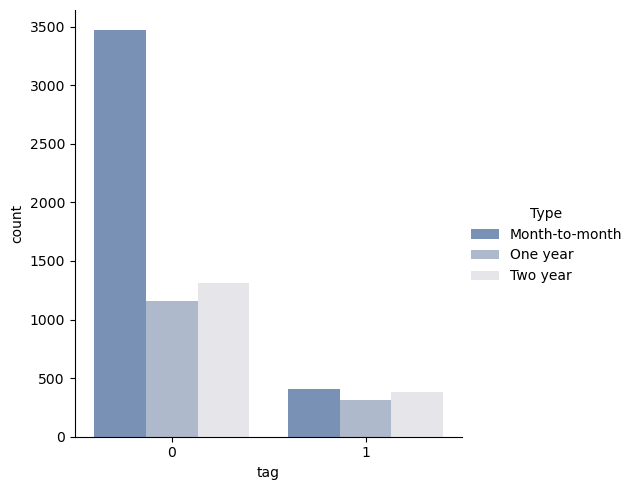

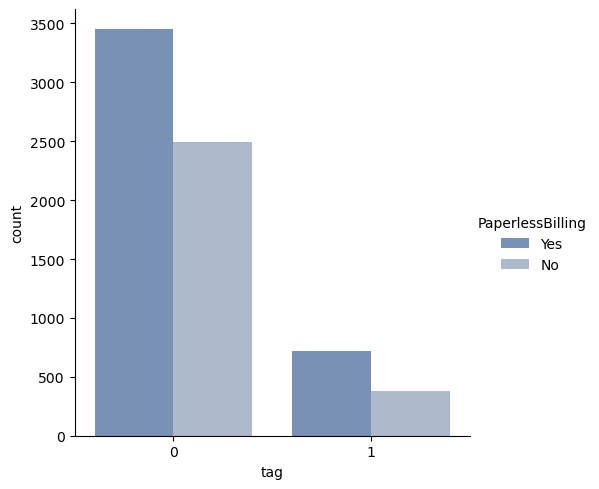

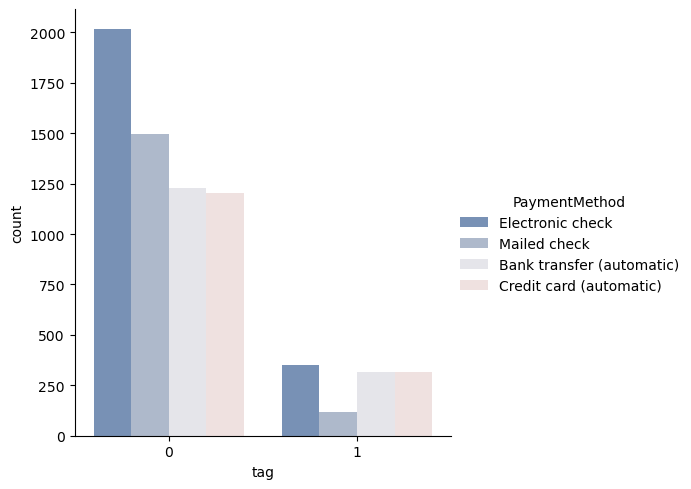

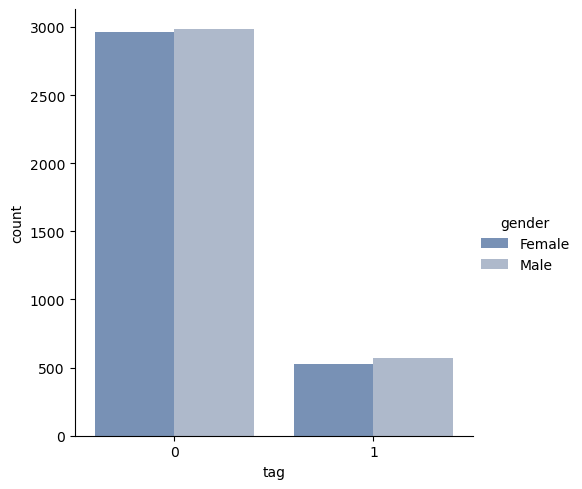

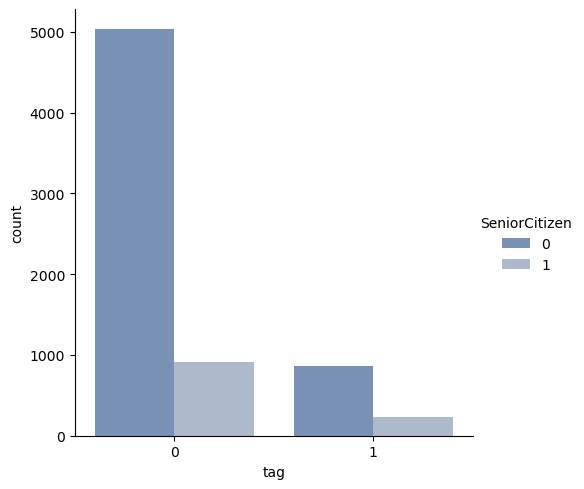

...

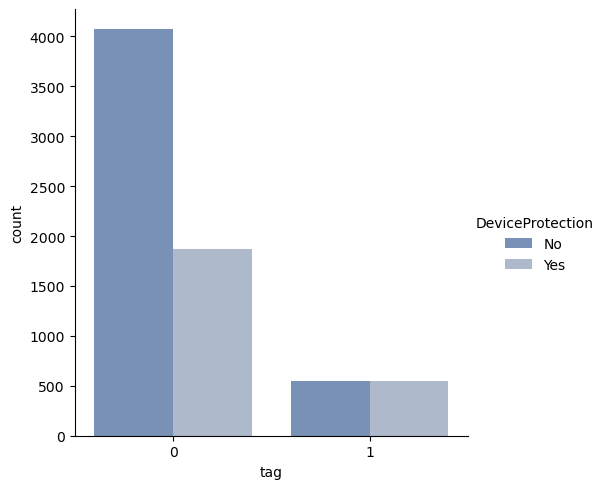

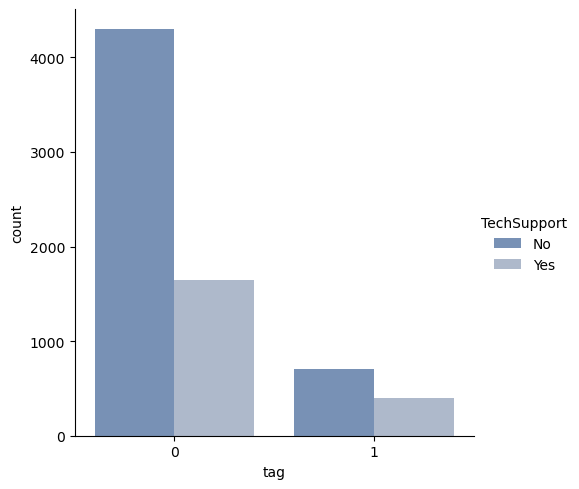

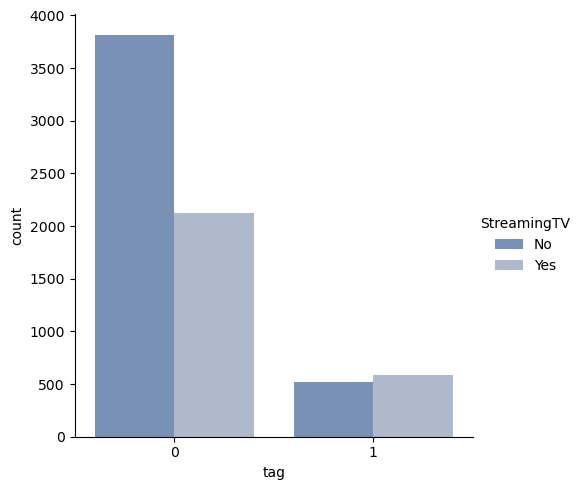

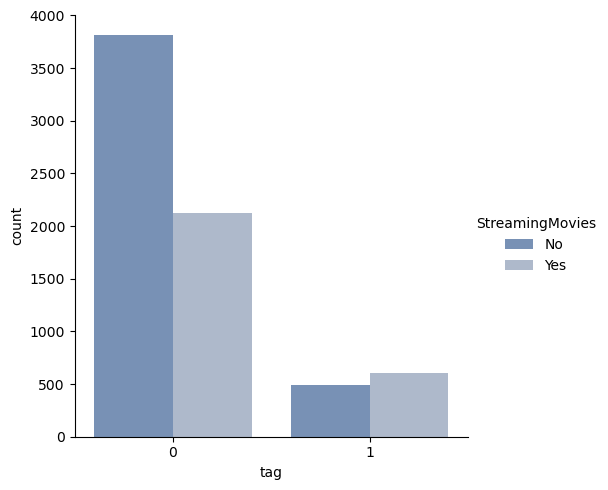

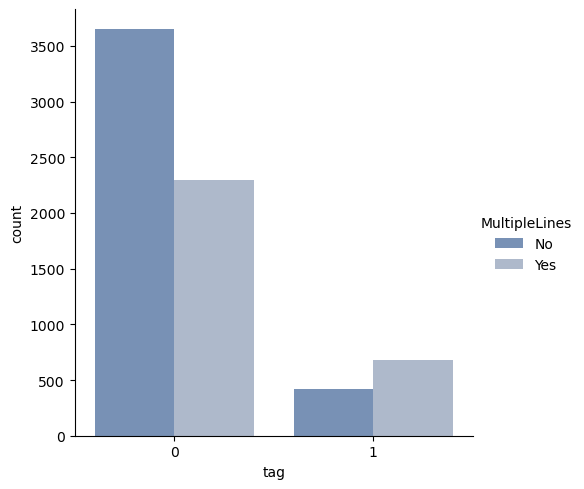

In [23]:
cat_columns = ['Type','PaperlessBilling','PaymentMethod','gender','SeniorCitizen','Partner','Dependents',
                      'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
                      'StreamingTV', 'StreamingMovies', 'MultipleLines']
for j in cat_columns:
    sns.catplot(data=df, x='tag', hue=j, kind='count', palette=sns.color_palette("vlag"))

- Оплата по месяцам в два раза популярнее, чем оплата сразу за один/два года, а вот у ушедших клиентов показатели примерно на одном уровне. 
- У ушедших клиентов в MultipleLines соотношение подключивших и неподключивших эту услугу противоположно оставшимся клиентам. Та же ситуация у StreamingMovies, StreamingTV, Partner.
- Так же отличаются распределения в колонках OnlineBackup, PaymentMethod (по одному пункту) и DeviceProtection.
- Столбец gender никак не скажется на результатах, так как выборка по мужчинам и женщинам равномерная. Позже удалим его.

Посмотрим корреляцию категориальных признаков

interval columns not set, guessing: ['SeniorCitizen']


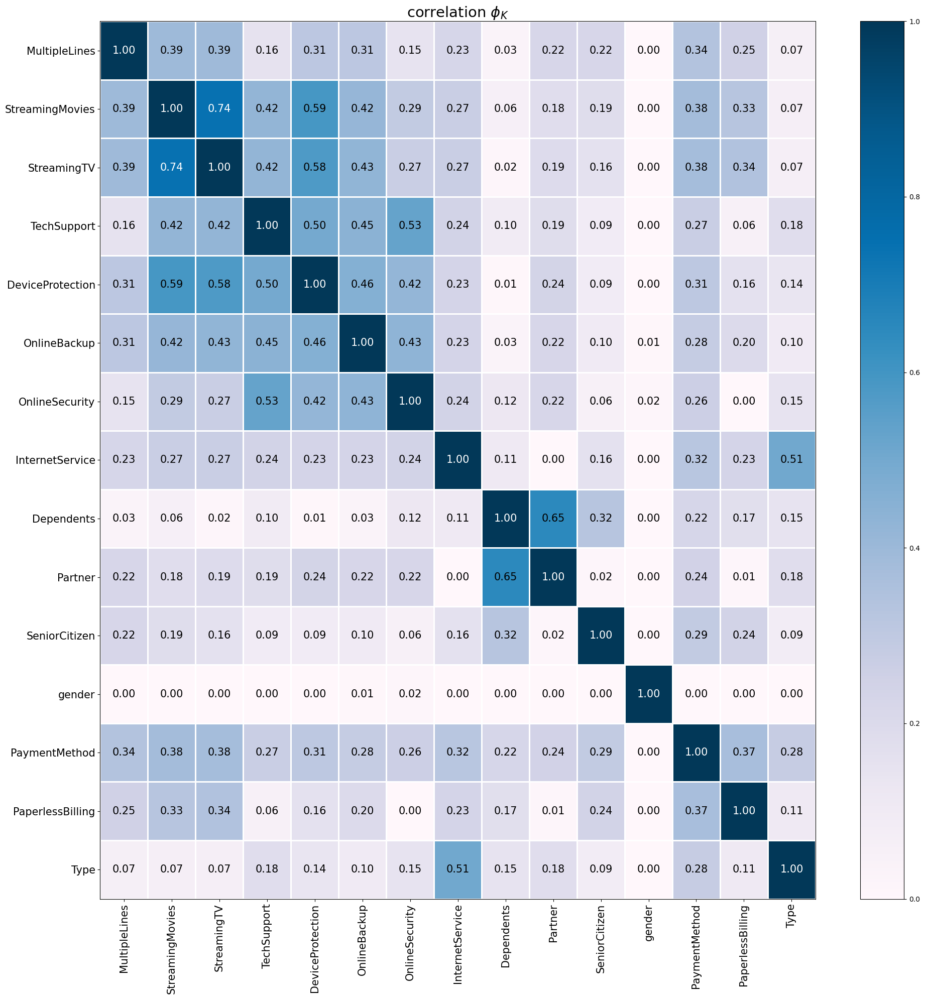

In [24]:
phik_overview = df[cat_columns].phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map='PuBu', 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(20, 20))
plt.tight_layout()

Далее взглянем на корреляюцию всех от всех

interval columns not set, guessing: ['MonthlyCharges', 'TotalCharges', 'tag', 'SeniorCitizen']


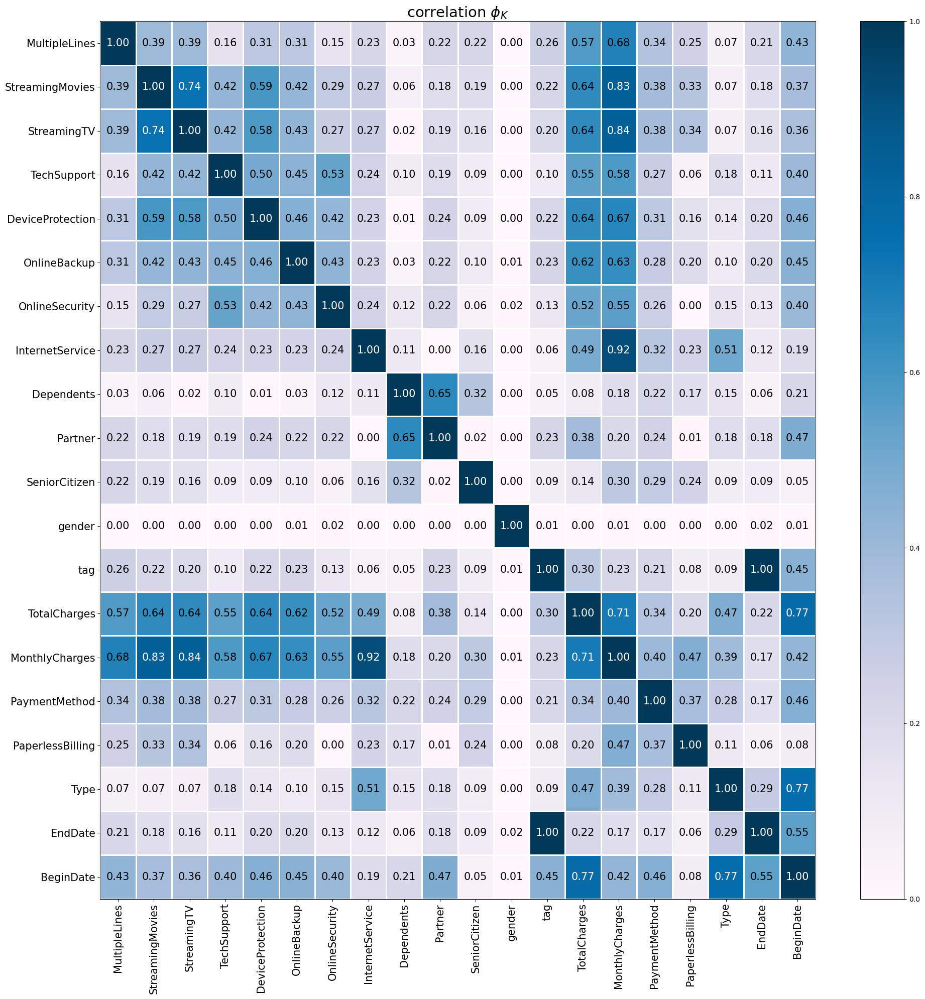

In [25]:
phik_overview = df.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map='PuBu', 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(20, 20))
plt.tight_layout()

Корреляция между StreamingTV и StreamingMovies 0.74.  
Тоже касается Partner и Dependents. Удалять мы их не будем пока. 
Так же наблюдается сильная корреляция в столбцах с датами. Для обучения они нам не нужны, а испортить модель могут. Удалим оба столбца, предварительно создав столбец с общим количеством дней пользования.

In [26]:
df['Days'] = (df['EndDate'] - df['BeginDate']).dt.days

In [27]:
del df['BeginDate'], df['EndDate'], df['gender']

Теперь вернемся к столбцам MonthlyCharges и TotalCharges. Посмотрим на корреляцию со столбцом Days.

In [28]:
columns = ['MonthlyCharges', 'TotalCharges', 'Days']
df[columns].corr()

,MonthlyCharges,TotalCharges,Days
MonthlyCharges,1.000000,0.630440,0.220054
TotalCharges,0.630440,1.000000,0.821746
Days,0.220054,0.821746,1.000000


TotalCharges проиграл эту битву. Возьмем на заметку, но удалять пока не будем.

### Вывод  

- Значения в MonthlyCharges распредедяются неравномерно. Есть пики на 20 и 80. Кажется такое распределение значений может говорить о наличии тарифов у оператора или каких то других "групп" клиентов. Гистограмма TotalCharges равномерно убывает. Аномальных выбросов я не увидела.
- Обнаружили корреляцию у MonthlyCharges и TotalCharges.
- Оплата по месяцам в два раза популярнее, чем оплата сразу за один/два года, а вот у ушедших клиентов показатели примерно на одном уровне. 
- У ушедших клиентов в MultipleLines соотношение подключивших и неподключивших эту услугу противоположно оставшимся клиентам. Та же ситуация у StreamingMovies, StreamingTV, Partner.
- Так же отличаются распределения в колонках OnlineBackup, PaymentMethod (по одному пункту) и DeviceProtection.
- Столбец gender никак не скажется на результатах, так как выборка по мужчинам и женщинам равномерная.
- Обнаружена корреляция между StreamingTV и StreamingMovies в 0.74, а также Partner и Dependents. 
- Наблюдается также корреляция целевого признака и столбцов с датами. Удалили их, предварительно создав новый столбец со временем пользования даннным оперетором.

# Подготовка данных для обучения

Разделим датафрейм на обучающую и тестовую выбороки

In [29]:
RANDOM_STATE = 50623
target = df['tag'] 
features = df.drop(columns=['tag'])
features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.25, random_state=RANDOM_STATE)

Закодируем категориальные данные с помощью One-Hot Encoding

In [30]:
features_train_not_ohe = features_train
features_test_not_ohe = features_test

In [31]:
cat_columns = features_train.select_dtypes(include='object').columns.to_list()
numeric = features_train.select_dtypes(exclude='object').columns.to_list()

In [32]:
cat_columns

['Type',
 'PaperlessBilling',
 'PaymentMethod',
 'Partner',
 'Dependents',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'MultipleLines']

In [33]:
numeric

['MonthlyCharges', 'TotalCharges', 'SeniorCitizen', 'Days']

In [171]:
from sklearn.preprocessing import OneHotEncoder

encoder_ohe = OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False)
encoder_ohe.fit(features_train[cat_columns])
new_columns = encoder_ohe.get_feature_names(cat_columns)
features_train[new_columns] = encoder_ohe.transform(features_train[cat_columns])
features_train = features_train.drop(cat_columns, axis=1)
features_test[new_columns] = encoder_ohe.transform(features_test[cat_columns])
features_test = features_test.drop(cat_columns, axis=1)
features_train.head()
features_test.head()

,MonthlyCharges,TotalCharges,SeniorCitizen,Days,Type_One year,Type_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,...,Dependents_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_Yes,OnlineBackup_Yes,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,MultipleLines_Yes
customerID,,,,,,,,,,,,,,,,,,,,,
1608-GMEWB,93.90,4225.50,1,1371,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
2070-FNEXE,76.45,636.06,1,245,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3771-PZOBW,90.70,1814.00,0,610,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
2930-UOTMB,65.25,1175.81,0,518,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
2951-QOQTK,80.80,404.00,0,153,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [172]:
features_train.head()

,MonthlyCharges,TotalCharges,SeniorCitizen,Days,Type_One year,Type_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,...,Dependents_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_Yes,OnlineBackup_Yes,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,MultipleLines_Yes
customerID,,,,,,,,,,,,,,,,,,,,,
5949-EBSQK,61.45,307.25,0,153,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4760-XOHVN,19.45,38.90,0,62,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2607-FBDFF,49.00,49.00,0,31,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3125-RAHBV,20.30,455.53,0,671,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2829-HYVZP,19.80,574.20,0,883,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [173]:
features_train.columns == features_test.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

Масштабируем количественные признаки

In [174]:
columns = ['MonthlyCharges', 'Days', 'TotalCharges']

scaler = StandardScaler()

scaler.fit(features_train[columns])

features_train = features_train.copy()
features_train[columns] = scaler.transform(features_train[columns])

features_test = features_test.copy()
features_test[columns] = scaler.transform(features_test[columns])

### Вывод  
- Разделили выборку на обучающую и тестовую с параметрами test_size=0.25 и random_state=50623
- Закондировали категориальные признаки с помощью One-Hot Encoding
- Масштабировали количественные признаки с помощью StandardScaler

# Обучение моделей

Модель LogisticRegression

In [175]:
%%time
model = LogisticRegression(random_state = RANDOM_STATE, solver='lbfgs', class_weight='balanced')
param = { 'C': list(range(1,15,3))}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=2, verbose=True, n_jobs=-1)
model = grid.fit(features_train, target_train)
model_LR = model.best_estimator_
score_LR = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_LR)

Fitting 2 folds for each of 5 candidates, totalling 10 fits
Best parameters: {'C': 1}
Best score: 0.7686979603288087
CPU times: user 118 ms, sys: 23 ms, total: 141 ms
Wall time: 218 ms


Модель RandomForestClassifier

In [176]:
%%time

model = RandomForestClassifier(random_state = RANDOM_STATE, class_weight='balanced')
param = {'n_estimators': list(range(50,300,50)), 'max_depth':[5,15], 'max_features':['sqrt', 'log2']}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=3, verbose=True, n_jobs=-1)
model = grid.fit(features_train, target_train)
model_RFC = model.best_estimator_
score_RFC = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_RFC)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 100}
Best score: 0.8186194183639643
CPU times: user 664 ms, sys: 122 ms, total: 785 ms
Wall time: 3.8 s


Модель LinearSVC

In [177]:
%%time

model = LinearSVC(random_state=RANDOM_STATE, max_iter=10000, class_weight='balanced', dual = True)
param = {'C': list(range(1,15,3)), 'penalty' : ['l1', 'l2']}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=3, verbose=True, n_jobs=-1)
model = grid.fit(features_train, target_train)
model_LSVC = model.best_estimator_
score_LSVC = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_LSVC)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number 

Best parameters: {'C': 13, 'penalty': 'l2'}
Best score: 0.7713298991528706
CPU times: user 1.94 s, sys: 33.2 ms, total: 1.98 s
Wall time: 4.93 s


Модель LGBMClassifier

In [178]:
%%time
model = LGBMClassifier(n_jobs=-1, random_state=RANDOM_STATE, class_weight='balanced')
param = {'n_estimators': [300, 500, 1000],
                  'learning_rate': [0.01, 0.1, 0.2, 0.5],
                  'max_depth': range(1, 9)}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=3, verbose=0,  n_jobs=-1)
model = grid.fit(features_train, target_train)
model_LGBM = model.best_estimator_
score_LGBM = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_LGBM)

Best parameters: {'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 1000}
Best score: 0.8989029883954812
CPU times: user 2.49 s, sys: 234 ms, total: 2.72 s
Wall time: 11.6 s


Модель XGBClassifier

In [179]:
%%time

ratio = target_train[target_train == 1].count() / target_train[target_train == 0].count()

model = XGBClassifier(random_state=RANDOM_STATE, scale_pos_weight=ratio)
param = {'n_estimators': [300, 500, 1000],
                  'learning_rate': [0.01, 0.1, 0.2, 0.5],
                  'max_depth': range(1, 9)}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=3, verbose=0,  n_jobs=-1)
model = grid.fit(features_train, target_train)
model_XGB = model.best_estimator_
score_XGB = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_XGB)

Best parameters: {'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 1000}
Best score: 0.9134983426707115
CPU times: user 6.31 s, sys: 445 ms, total: 6.75 s
Wall time: 1min 21s


Модель CatBoostClassifier

In [180]:
%%time

cat_features = ['Type', 'PaperlessBilling', 'PaymentMethod',
                'SeniorCitizen', 'Partner', 'InternetService', 'Dependents',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingMovies', 'MultipleLines', 'StreamingTV']

model = CatBoostClassifier(random_state=RANDOM_STATE, auto_class_weights='Balanced', cat_features=cat_features)
param = {'max_depth':range(1, 9), 'learning_rate':[0.01, 0.1, 0.2, 0.5], 'iterations': [300, 500, 1000]}
grid = GridSearchCV(model, param_grid=param, scoring='roc_auc', cv=3, verbose=0,  n_jobs=-1)
model = grid.fit(features_train_not_ohe, target_train)
model_CBC = model.best_estimator_
score_CBC = model.best_score_
print('Best parameters:', model.best_params_)
print('Best score:', score_CBC)

0:	learn: 0.6922593	total: 58.1ms	remaining: 17.4s
1:	learn: 0.6914269	total: 60.3ms	remaining: 8.99s
2:	learn: 0.6907779	total: 62ms	remaining: 6.14s
3:	learn: 0.6901419	total: 64.7ms	remaining: 4.79s
4:	learn: 0.6896007	total: 66.5ms	remaining: 3.92s
5:	learn: 0.6887465	total: 69.7ms	remaining: 3.41s
6:	learn: 0.6881246	total: 71.8ms	remaining: 3s
7:	learn: 0.6872700	total: 74ms	remaining: 2.7s
8:	learn: 0.6867934	total: 75.6ms	remaining: 2.44s
9:	learn: 0.6861837	total: 77.1ms	remaining: 2.24s
10:	learn: 0.6858276	total: 78.6ms	remaining: 2.06s
11:	learn: 0.6852355	total: 80.5ms	remaining: 1.93s
12:	learn: 0.6847736	total: 84.8ms	remaining: 1.87s
13:	learn: 0.6842188	total: 88ms	remaining: 1.8s
14:	learn: 0.6834324	total: 89.8ms	remaining: 1.71s
15:	learn: 0.6829161	total: 91.7ms	remaining: 1.63s
16:	learn: 0.6823337	total: 93.3ms	remaining: 1.55s
17:	learn: 0.6817630	total: 96.3ms	remaining: 1.51s
18:	learn: 0.6813149	total: 97.9ms	remaining: 1.45s
19:	learn: 0.6807571	total: 100ms

Сделаем сводную таблицу с результатами

In [181]:
index = ['LogisticRegression',
         'RandomForestClassifier',
         'LinearSVC', 'LGBMClassifier', 'XGBClassifier', 'CatBoostClassifier']
data = {'ROC-AUC':[score_LR, score_RFC, score_LSVC, score_LGBM, score_XGB, score_CBC]}

scores_data = pd.DataFrame(data=data, index=index)
scores_data

,ROC-AUC
LogisticRegression,0.768698
RandomForestClassifier,0.818619
LinearSVC,0.771330
LGBMClassifier,0.898903
XGBClassifier,0.913498
CatBoostClassifier,0.923444


### Вывод 
 Лидерами обучения являются модели со следующими показателями:
 - LGBMClassifier, ROC-AUC = 0.898903
 - XGBClassifier, ROC-AUC = 0.913498
 - CatBoostClassifier, ROC-AUC = 0.920756  
 
Для тестирования возмем лучшую модель из представленных с гиперпараметрами:
- CatBoostClassifier, ROC-AUC = 0.920756,  iterations=1000,  learning_rate=0.5,  max_depth=2.

# Тестирование лучшей модели

Accuracy:  0.9063032367972743
AUC-ROC:  0.9107108081791626


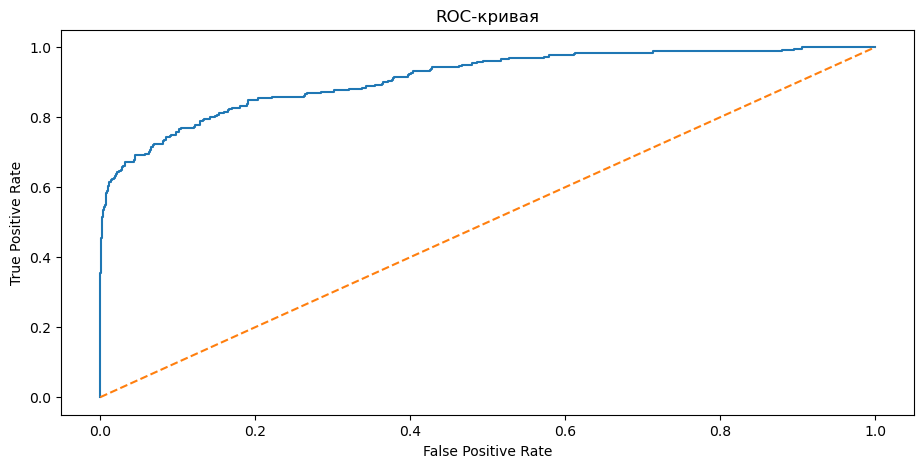

In [182]:
pred_proba_test = model_CBC.predict_proba(features_test_not_ohe)[:, 1]
pred_test = model_CBC.predict(features_test_not_ohe)

print('Accuracy: ', model_CBC.score(features_test_not_ohe, target_test))
print('AUC-ROC: ', roc_auc_score(target_test, pred_proba_test))
fpr, tpr, thresholds = roc_curve(target_test, pred_proba_test)

plt.figure(figsize=(11, 5))
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC-кривая')

plt.show()

Посмотрим на распределение важности признаков

In [183]:
im_df = pd.DataFrame(model_CBC.feature_importances_, index = features_test_not_ohe.columns, columns=['import'])
im_df = im_df.sort_values(by='import', ascending=False)
im_df

,import
Days,63.284734
TotalCharges,12.378425
MonthlyCharges,11.063366
Type,2.121599
Partner,1.263755
Type_Two year,1.174548
PaymentMethod,1.145428
PaymentMethod_Mailed check,0.934949
MultipleLines_Yes,0.921341
OnlineBackup_Yes,0.697405


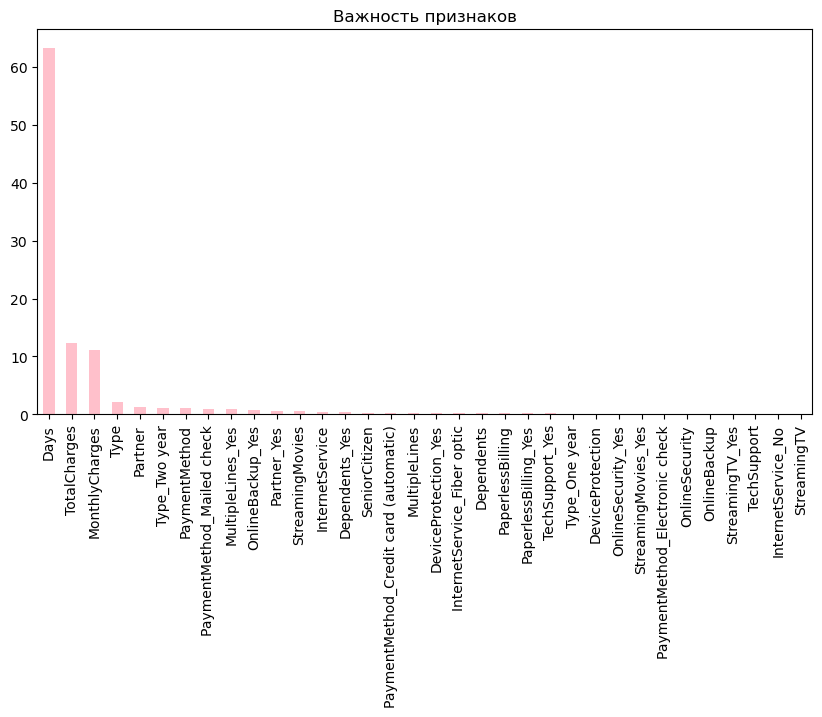

In [184]:
im_df.plot(kind='bar', figsize=(10, 5), title='Важность признаков', color='pink', legend=False)
plt.show()

### Вывод 

Показатели на тестовой выборке:
- Accuracy:  0.9114139693356048
- AUC-ROC:  0.9083790293650387  

Самыми важными признаками являются:
- Время пользования услугами оператора (61.7%), 
- Сумма потрачененных средств на услуги (16.7%), 
- Ежемесячные траты на услуги (9.6%)

# Итоговый вывод

1. В проекте проведена работа по предсказанию отказа клиента от услуг оператора сотовой связи для предоставления первому дополнительных бонусов и сохранения клиента.
2. Проведено знакомство с данными. Выгружены и проверены типы данных и наличие пропусков.
3. Далее проведена предобработка данных. Обьединили датафреймы по ключу customerID, избавились от пропусков в последствии и изменили типы данных.
4. Исследовательский анализ данных. Визуализировали категориальные и количественные признаки. Выявили корреляцию в различных признаках. Убрали столбцы с датами и сгененрировали новый признак с количеством дней использования услуг. На основе предварительного анализа можно сказать, что со временем вероятность отказа от услуг снижается, также чаще от услуг отказываются те, кто больше за них платит. 
5. Подготовили данные для обучения модели. Разделили данные на выборки, закодировать категориальные признаки с помощью OneHotEncoder, для линейных моделей масштабировали числовые признаки.
6. Обучение моделей. Был произведен подбор гиперпараметров и обучение следующих моделей: 
| Model | ROC_AUC |
| ------ | ------ |
| LogisticRegression | 0.768698 |
| RandomForestClassifier | 0.818619 |
| LinearSVC | 0.771330 |
| LGBMClassifier | 0.898903 |
| XGBClassifier | 0.913498 |
| CatBoostClassifier | 0.920756 |
7. Тестирование наилучшей модели. Для теста была выбрана модель: 
- CatBoostClassifier, ROC-AUC = 0.920756,  iterations=1000,  learning_rate=0.5,  max_depth=2.   

Показатели на тестовой выборке:  
- Accuracy:  0.9114139693356048
- AUC-ROC:  0.9083790293650387   

Самыми важными признаками являются:  
- Время пользования услугами оператора (61.7%), 
- Сумма потрачененных средств на услуги (16.7%), 
- Ежемесячные траты на услуги (9.6%)
8. Рекомендации для оператор связи «Ниединогоразрыва.ком»: 
- Стоит обращать особое внимание на новых пользователей. Возможно стоит предлагать новичкам более выгодные тарифы и услуги. 
- Также стоит уделить внимание группам пользователей с высокими показателями оплат услуг в месяц. Хорошим вариантом будет предоставлять скидку на оплату за несколько месяцев и год. Хорошим спосбом удержать клиентов - ввести бонусную программу по типу "чем больше платишь - тем больше скидка/бонусы".

# Отчет

В проекте были выполнены следующие пункты: 
- Знакомство с данными. Выгружены и проверены типы данных и наличие пропусков.
- Предобработка данных. Добавлен целевой признак ухода/неухода клиента. Заменили в EndDate значения "No" датой выгрузки датасета. Заменили тип данных в BeginDate, EndDate и TotalCharges и избавились от попусков. Обьеденили датасеты и устранили пропуски. 
- Исследовательский анализ данных. Визуализировали категориальные и количественные признаки. Выявили корреляцию в MonthlyCharges и TotalCharges, StreamingTV и StreamingMovies, Partner и Dependents. Убрали столбцы с датами и сгененрировали новый признак с количеством дней использования услуг. Избавились от столбца gender, так как он не влияет на уход клиента, но может помешать обученнию модели. На основе предварительного анализа предположили, что со временем вероятность отказа от услуг снижается, также чаще от услуг отказываются те, кто больше за них платит.
- Подготовили данные для обучения модели. Разделили данные на выборки с параметрами test_size=0.25, random_state=50623; закодировать категориальные признаки с помощью OneHotEncoder, для линейных моделей масштабировали числовые признаки.
- Обучение моделей. Для обучения были выбраны следующие признаки: 
1. *Категориальные*  
    'Type' - тип оплаты,
    'PaperlessBilling' - безналичный расчет,
    'PaymentMethod' – способ оплаты,,
    'Partner' - наличие супруга(и),
    'Dependents' - наличие иждивенцев,
    'SeniorCitizen' - наличие пенсионного статуса по возрасту,
    'InternetService' - интернет сервис,
    'OnlineSecurity' - онлайн защита,
    'OnlineBackup' - резервное копирование,
    'DeviceProtection' - защита устройства,
    'TechSupport' - тех поддержка,
    'StreamingTV' - ТВ,
    'StreamingMovies' - фильмы,
    'MultipleLines' - наличие возможности ведения параллельных линий во время
    звонка. 
2. *Количественные*  
    'MonthlyCharges' – ежемесячные траты на услуги,
    'TotalCharges' - общие траты,
    'Days' - общее количество дней пользования услугами оператора (сгенерированный признак).
3. *Целевой*  
    'tag' - факт ухода клиента (сгенерированный признак).  


Был произведен подбор гиперпараметров и обучение следующих моделей:

| Model | ROC_AUC |
| ------ | ------ |
| LogisticRegression | 0.768698 |
| RandomForestClassifier | 0.818619 |
| LinearSVC | 0.771330 |
| LGBMClassifier | 0.898903 |
| XGBClassifier | 0.913498 |
| CatBoostClassifier | 0.920756 |

- Тестирование наилучшей модели. Для теста была выбрана модель:  
    CatBoostClassifier, ROC-AUC = 0.920756,  iterations=1000,  learning_rate=0.5,  max_depth=2.    
 
 
- Показатели на тестовой выборке:   
1. Accuracy:  0.9114139693356048
2. AUC-ROC:  0.9083790293650387   
  
  
- Самыми важными признаками являются:  
1. Время пользования услугами оператора (61.7%), 
2. Сумма потрачененных средств на услуги (16.7%), 
3. Ежемесячные траты на услуги (9.6%)
  
  
- Рекомендации для оператор связи «Ниединогоразрыва.ком»: 
1. Стоит обращать особое внимание на новых пользователей. Возможно стоит предлагать новичкам более выгодные тарифы и услуги. 
2. Также стоит уделить внимание группам пользователей с высокими показателями оплат услуг в месяц. Хорошим вариантом будет предоставлять скидку на оплату за несколько месяцев и год. Хорошим спосбом удержать клиентов - ввести бонусную программу по типу "чем больше платишь - тем больше скидка/бонусы".
  
  
- Отличия от исходного плана работ:
1. приводить названия столбцов к нижнему регистру не понадобилось;
2. выбросы не были обнаружены;
3. были добавлены столцы с целевым признаком и временем пользования услугами;
4. обучалось 6 моделей, вместо заявленных 2-3, так как на начальном этапе не удавалось добиться нужных показателей метрики и пришлось импровизировать с различными моделями;
5. после тестирования была добавлена визуализация важности признаков.  

Трудностей в работе не встречалось, все этапы выполнения проекта являются важными и нельзя опускать ни один из них. 
